## imports, etc. 

In [11]:
import os
import warnings
import cv2
import numpy as np
import matplotlib.pyplot as plt

from dataclasses import dataclass
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning.pytorch as pl
from torchvision import transforms
from transformers import SegformerForSemanticSegmentation

# To filter UserWarning.
warnings.filterwarnings("ignore", category=UserWarning)

## data class configurations and color map

In [12]:
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES:   int = 4 # including background.
    IMAGE_SIZE: tuple[int,int] = (288, 288) # W, H
    MEAN: tuple = (0.485, 0.456, 0.406)
    STD:  tuple = (0.229, 0.224, 0.225)
    BACKGROUND_CLS_ID: int = 0
   
@dataclass
class InferenceConfig:
    BATCH_SIZE:  int = 10
    NUM_BATCHES: int = 2
    
# Create a mapping of class ID to RGB value.
id2color = {
    0: (0, 0, 0),    # background pixel
    1: (0, 0, 255),  # Stomach
    2: (0, 255, 0),  # Small Bowel
    3: (255, 0, 0),  # large Bowel
}

## image overlay and num to RBG functions

In [13]:
def num_to_rgb(num_arr, color_map=id2color):
    single_layer = np.squeeze(num_arr)
    output = np.zeros(num_arr.shape[:2] + (3,))

    for k in color_map.keys():
        output[single_layer == k] = color_map[k]

    # return a floating point array in range [0.0, 1.0]
    return np.float32(output) / 255.0

# Function to overlay a segmentation map on top of an RGB image.
def image_overlay(image, segmented_image):
    alpha = 1.0  # Transparency for the original image.
    beta = 0.7  # Transparency for the segmentation map.
    gamma = 0.0  # Scalar added to each sum.

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return np.clip(image, 0.0, 1.0)

## get model function

In [14]:
def get_model(*, model_name, num_classes):
    model = SegformerForSemanticSegmentation.from_pretrained(
        model_name,
        num_labels=num_classes,
        ignore_mismatched_sizes=True,
    )
    return model

## Medical Segmentation Model Class integrated with PyTorch Lightning

In [15]:
class MedicalSegmentationModel(pl.LightningModule):
    def __init__(
        self,
        model_name: str,
        num_classes: int = 10,
        init_lr: float = 0.001,
        optimizer_name: str = "Adam",
        weight_decay: float = 1e-4,
        use_scheduler: bool = False,
        scheduler_name: str = "multistep_lr",
        num_epochs: int = 1,
    ):
        super().__init__()

        # Save the arguments as hyperparameters.
        self.save_hyperparameters()

        # Loading model using the function defined above.
        self.model = get_model(model_name=self.hparams.model_name, num_classes=self.hparams.num_classes)

    def forward(self, data):
        outputs = self.model(pixel_values=data, return_dict=True)
        upsampled_logits = F.interpolate(outputs["logits"], size=data.shape[-2:], mode="bilinear", align_corners=False)
        return upsampled_logits

## Set path to the checkpoint then load it into the model!

In [16]:
CKPT_PATH = '/Users/dianawalsh/dats-data/static/ckpt_009.ckpt'

model = MedicalSegmentationModel.load_from_checkpoint(CKPT_PATH)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([4, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## trying my own inference function again which accepts image paths

In [17]:
@torch.inference_mode()
def inference(model, image_paths, img_size, batch_size=10, device="cpu"):
    num_images = len(image_paths)
    num_batches = (num_images + batch_size - 1) // batch_size

    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, num_images)
        batch_images = []

        for idx in range(start_idx, end_idx):
            image_path = image_paths[idx]
            image = Image.open(image_path).convert("RGB")
            image = image.resize(img_size)
            image = transforms.ToTensor()(image)
            batch_images.append(image)

        batch_images = torch.stack(batch_images).to(device)

        # Perform inference
        predictions = model(batch_images)

        # Post-process predictions if needed
        pred_all = predictions.argmax(dim=1).cpu().numpy()

        # Display or save results
        display_results(batch_images, pred_all)


## getting image paths

In [18]:
image_dir = "/Users/dianawalsh/dats-data/static/uploads/normalized/"
image_paths = []

# Iterate through files in the directory
for filename in os.listdir(image_dir):
    # Check if the file is a PNG image
    if filename.endswith(".png"):
        # Construct the full path
        image_path = os.path.join(image_dir, filename)
        # Add the path to the list
        image_paths.append(image_path)

## display function 
#### (to be replaced with saving images and moving around flask)

In [19]:
def display_results(batch_images, pred_all):
    num_images = len(batch_images)
    
    for i in range(num_images):
        fig, axes = plt.subplots(1, 3, figsize=(20, 8))

        # Display the original image
        axes[0].imshow(batch_images[i].permute(1, 2, 0))
        axes[0].set_title("Actual frame")
        axes[0].axis("off")

        # Display the predicted segmentation mask
        pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
        axes[1].imshow(pred_mask_rgb)
        axes[1].set_title("Predicted labels")
        axes[1].axis("off")

        # Display the predicted segmentation mask overlayed on the original image.
        batch_img_np = batch_images[i].permute(1, 2, 0).numpy()
        overlayed_image = image_overlay(batch_img_np, pred_mask_rgb)
        axes[2].imshow(overlayed_image)
        axes[2].set_title("Overlayed image")
        axes[2].axis("off")

        plt.show()


## LET'S GO!!

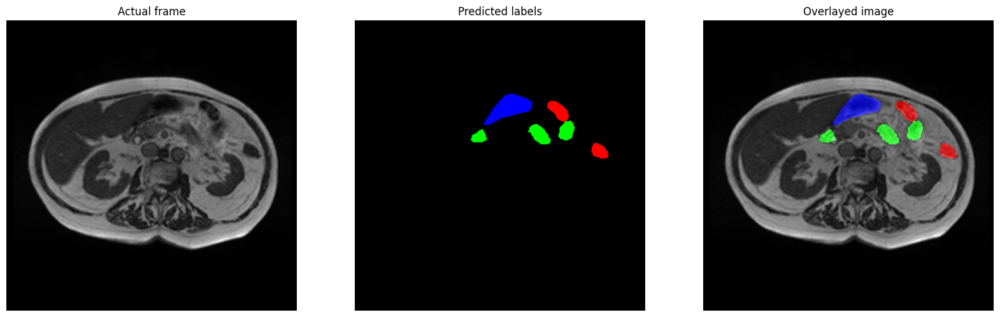

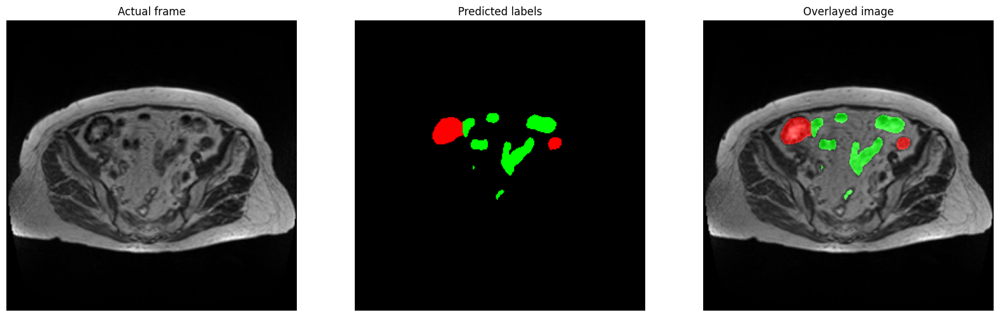

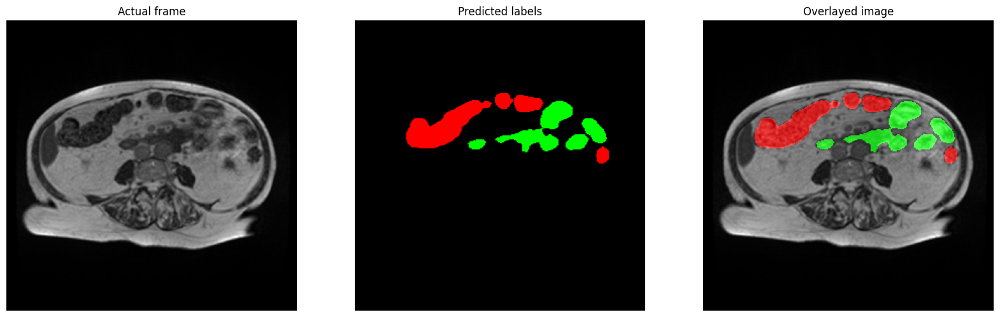

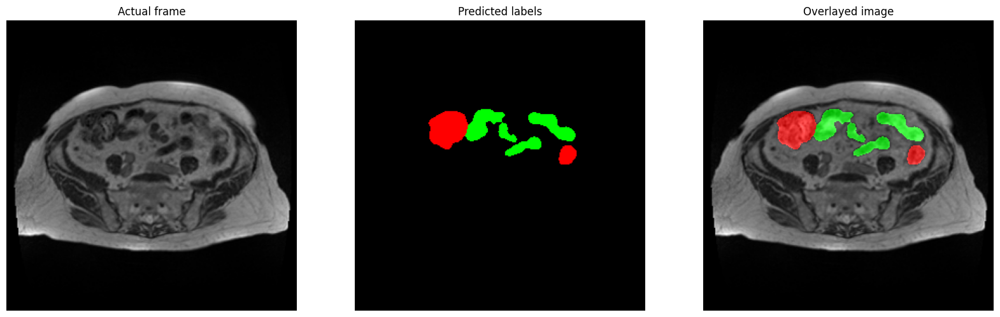

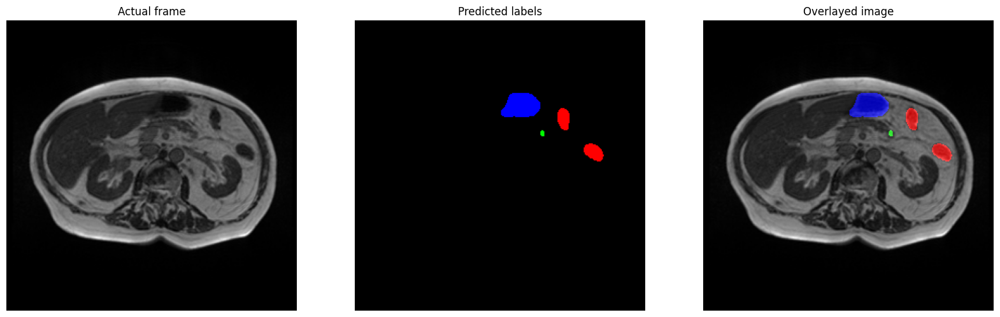

...

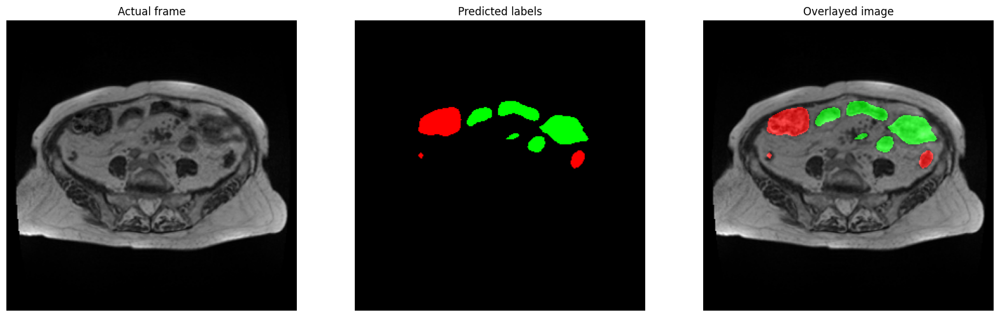

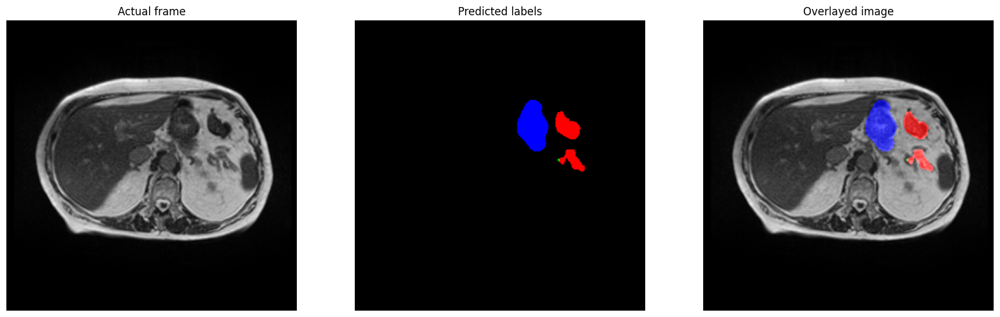

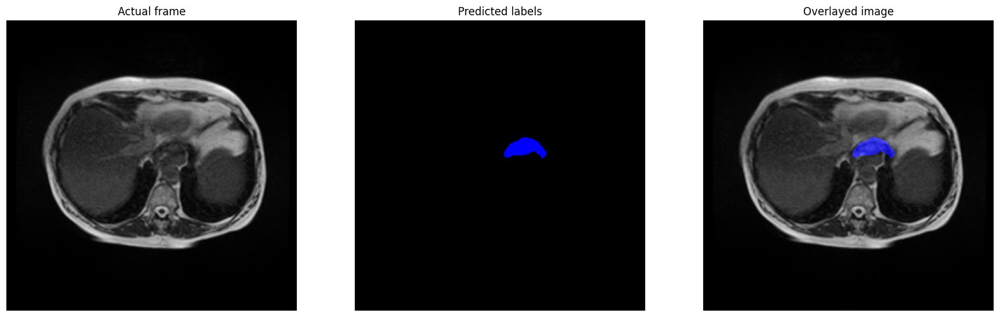

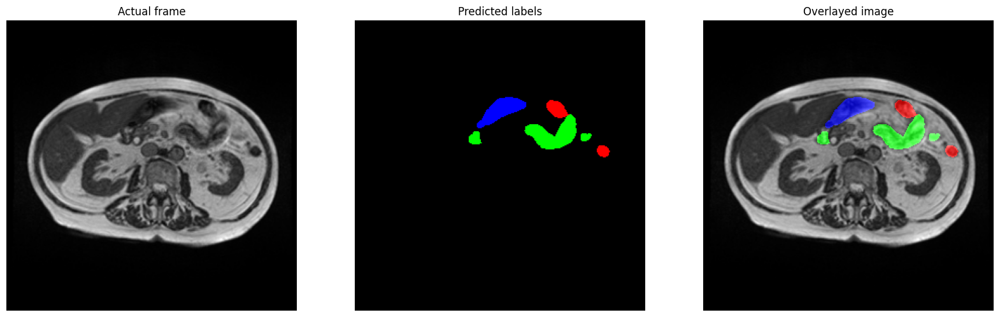

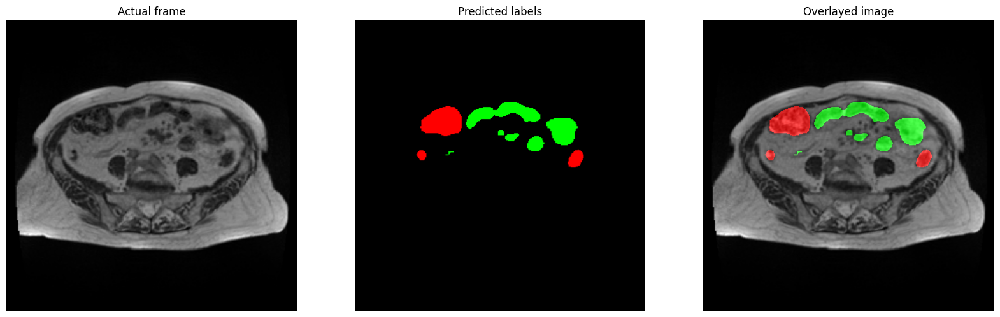

In [ ]:
# Usage
# Use GPU if available.
DEVICE = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model.to(DEVICE)
model.eval()

inference(model, image_paths, img_size=DatasetConfig.IMAGE_SIZE, batch_size=10, device=DEVICE)